<a href="https://colab.research.google.com/github/ChristianConchari/Computer-Vision-Notes/blob/master/Tutorial_20_Object%20Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 20: Object Detection

Last week, you had the chance to see the three most used models for object detection, of which [YOLO](https://arxiv.org/abs/1506.02640) is  the most known and has compelling metrics in this field. One of its creators, Joseph Redmon, invented and released the first version in May 2016 and it was the biggest step forward in real-time object detection. He and his team then worked on further enhancements and released two more versions YOLO v2 and v3. After the version 3 release Joseph Redmon announced that he had decided to stop any further research in this model to avoid the [misuse of the technology](https://analyticsindiamag.com/yolo-creator-joe-redmon-computer-vision-research-ethical-concern/). After two years of the v3 release, Alexey Bochkovskiy released the YOLO v4 version (April 2020) with the paper “YOLOv4: Optimal Speed and Accuracy of Object Detection” and it performed much better than v3.

But just after a few days of the fourth version release (June 2020), Glenn R. Jocher, Founder & CEO at Ultralytics, proposed a new version with some meaningful improvements. Being a researcher out of the main AI labs and not releaseing the fifth version through a regular paper caused many [controversies](https://github.com/AlexeyAB/darknet/issues/5920) to Glenn. In this tutorial, we will try to use this version because it's based on PyTorch while all the other previous versions were based on the [Darknet platform](https://pjreddie.com/darknet/).

<img src="https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F436969%2F44ea6fe6e61f22471be5788407518d7e%2FYOLOv4-performance.png?generation=1595469398768719&alt=media" width="500" align="center" />

## 1. Download the model 

The model can be loaded from the PyTorch Hub with: 

 `model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)`. 

[The PyTorch Hub](https://pytorch.org/hub/) is another repository where you can discover pre-trained models. However, this time we will download the model from the official repository because this is relatively new and keeps updating. 

**After runnning the next cell, you will have to restart the session. This can be done by pressing 'Restart Runtime'**

In [ ]:
# Clone the model 
!git clone https://github.com/ultralytics/yolov5  

# install dependencies
!pip install -U -r yolov5/requirements.txt  

Cloning into 'yolov5'...
remote: Enumerating objects: 6872, done.
remote: Counting objects: 100% (176/176), done.
remote: Compressing objects: 100% (107/107), done.
remote: Total 6872 (delta 103), reused 115 (delta 68), pack-reused 6696
Receiving objects: 100% (6872/6872), 9.03 MiB | 35.56 MiB/s, done.
Resolving deltas: 100% (4710/4710), done.
Requirement already up-to-date: matplotlib>=3.2.2 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 4)) (3.4.2)
Requirement already up-to-date: numpy>=1.18.5 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 5)) (1.20.3)
Requirement already up-to-date: opencv-python>=4.1.2 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 6)) (4.5.2.52)
Requirement already up-to-date: Pillow in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 7)) (8.2.0)
Requirement already up-to-date: PyYAML>=5.3.1 in /usr/local/lib/python3.7/dist-packages (f

Yolo v5 comes with several pretrained versions. 

<img src="https://user-images.githubusercontent.com/26833433/103595982-ab986000-4eb1-11eb-8c57-4726261b0a88.png" width="500" align="center" />

This time, we will use Yolov5s because we have three classes and the dataset will be small. On the other hand, you can also try the other models if your task is complex. As you can see, Yolov5x has more precision and its heavier, which might involve difficulties when deploying. 

In [ ]:
# access the yolov5 folder and show the model's architecture
%cd /content/yolov5
%cat /content/yolov5/models/yolov5s.yaml

/content/yolov5
# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone

In [ ]:
import torch
from IPython.display import Image  # for displaying images
from utils.google_utils import gdrive_download  # for downloading models/datasets

# check if we're using torch with GPU
print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.8.1+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


## 2. Prepare the dataset

So far, we used public datasets to train our models. However, this is sometimes not possible due to different reasons. For example, the dataset for your problem would have not collected yet. Even though there might be related datasets to your problem, you might need something very specific to the problem's context and time. In such cases, you will need to create your dataset. First, you will have to define the setup, light conditions, environment, and the tools (cameras, additional lights, people?). Second, you will have to select a labelling/annotation tool. This will help you label the images with classes or create segments inside the collected images. 

You can see a best practices and a comparison of tools based on their functions, cost, and availability [here](https://humansintheloop.medium.com/best-annotation-tools-for-computer-vision-of-2021-38cb0b57a434) and [here](https://blog.superannotate.com/guide-to-data-labeling/?fbclid=IwAR2RhqjTwsucacUChRkMcKSEGtYk_mPt6FY4O7KjQFXqWzLNMFMzSa02Enk). Some of these tools are [Roboflow](https://roboflow.com/) and [Superannotate](https://superannotate.com/), which  are two web platforms with multiple resources to annotate, train, and automate a computer vision pipeline, however, they are not open source. 

This time, we will use a dataset from Roboflow because this platform has a feature to transform labells into Yolo v5 format. For this tutorial, you will have to signup at the Roboflow platform  and download any of the public datasets available at https://public.roboflow.com/. To do this, you will have to select the raw version and export to YOLO v5 Pytorch format. This last step will show you a URL that you will have to copy in the followin code. 

In [ ]:
# You need to sign up in roboflow to get the key and then you can use the dataset
!curl -L "https://public.roboflow.com/ds/S7Rj7LW36T?key=o7rjm9Wz3N" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!ls

Streaming output truncated to the last 5000 lines.
 extracting: train/labels/004879_jpg.rf.0d5c27700ff04fb911be2cc0b0ae7e44.txt  
 extracting: train/labels/000307_jpg.rf.0da33908e280d7c9d61d7cb6470ecd3f.txt  
 extracting: train/labels/005099_jpg.rf.0de8be5e21e09352a246b6c1faf53ecc.txt  
 extracting: train/labels/004482_jpg.rf.0d541b29bd4b4ededc19b5cafebb4fe9.txt  
 extracting: train/labels/000735_jpg.rf.0d5b96188e544511c13ac1e1bfff0b87.txt  
 extracting: train/labels/001653_jpg.rf.0cc3a72fd244aa7aadee6c4d766190df.txt  
 extracting: train/labels/002922_jpg.rf.0d24f020d6f688f966ef38c7a0eeba3e.txt  
 extracting: train/labels/004334_jpg.rf.0c7c46e2c74725ad2f93e916dc2422dd.txt  
 extracting: train/labels/002574_jpg.rf.0da9a892cf793903da78d6440b58779b.txt  
 extracting: train/labels/002336_jpg.rf.0ca4ec6f6ebaabe8df1781814ea731d9.txt  
 extracting: train/labels/001254_jpg.rf.0cb559668c7f79bc74c9f6b1a276d90d.txt  
 extracting: train/labels/004239_jpg.rf.0da69bb76e5393015f1e10528419a3fd.txt  
 

This time, we will work with the Hard Hat Workers dataset, which contains annotated images of workers in workplace settings that require a hard hat. We will use yolo to detect if a worker has a helmet.  https://public.roboflow.com/object-detection/hard-hat-workers

<img src="https://i.imgur.com/7spoIJT.png" width="300" align="center" />

Any Roboflow dataset comes with a `.yaml` file that will help us define the location of the training and testing subsets as well as the classes. Nevertheless, this file usually requires an update to match the correct locations and sometimes the classes as well.

In [ ]:
# visualise the content of data.yaml
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
# define the number of classes
num_classes = 3

# IPython is a great tool for interactive shells as Notebooks. It comes with 
# many utilities and we will use register_line_cell_magic
# to overwrite a file directly from a Colab cell. Otherwise, we would need to 
# download and upload the file. We define writetemplate to customize iPython 
# writefile 
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# change the location of the training and validation subsets. The rest
# of the file remains equal. 

%%writetemplate /content/yolov5/data.yaml

train: ./train/images
val: ./test/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
%cat data.yaml


train: ./train/images
val: ./test/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
# change the number of classes defined in the yolo v5 architectures. the rest remains the same. 
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes 
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat models/custom_yolov5s.yaml


# parameters
nc: 3  # number of classes 
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[

## 3. Train the model

Training with Yolov5 can be done by using a script named `train.py`, which will require the following parameters:

* **img:** input image size (width == height)
* **batch:** batch size
* **epochs:** number of training epochs. 
* **data:** path to our yaml file
* **cfg:** model configuration
* **weights:** custom path to save the best weights. 
* **name:** output file with metric results
* **nosave:** boolean that specifies to only save the final checkpoint
* **cache:** boolean that specifies to cache images for faster training

In [ ]:
# Since we exported the dataset for Yolo v5, we don't need to resize the images.
# We will train the model for 5 epoch with batch size of 80, however, you can 
# change these parameters to get a better performance
# train.py uses the subsets information from data.yaml. 

%cd /content/yolov5/
!python train.py --img 416 --batch 20 --epochs 10 --data './data.yaml' --cfg './models/custom_yolov5s.yaml' --weights ''

/content/yolov5
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-143-g3597d28 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=20, bbox_interval=-1, bucket='', cache_images=False, cfg='./models/custom_yolov5s.yaml', data='./data.yaml', device='', entity=None, epochs=10, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp6', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=20, upload_dataset=False, weights='', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-06-05 00:39:10.063762: I tensorflow/stream_executor/platform/default/dso_loader.c

## 4. Evaluate the model


The point of downloading YOLO v5 from Github is that it comes with many scripts for training, evaluating, and ploting results. For instance, the repository includes a great utility function `plot_results()` that allows you to evaluate your model performance on the last training run:

In [ ]:
!cp /content/yolov5/runs/train/exp/results.txt /content/yolov5
!python -m pip uninstall matplotlib
!pip install matplotlib==3.1.3

Uninstalling matplotlib-3.4.2:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.4.2-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.4.2.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? y
  Successfully uninstalled matplotlib-3.4.2
  Using cached https://files.pythonhosted.org/packages/4c/9b/35ab3469fd1509f7636a344940569ebfd33239673fd2318e80b4700a257c/matplotlib-3.1.3-cp37-cp37m-manylinux1_x86_64.whl
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [ ]:
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
from utils.plots import plot_results
plot_results()

Now, we can use the `detect.py` script to run the model inference with the best weights.
- **source:** input images directory or single image path or video path
- **weights:** trained model path
- **conf:** confidence threshold

The following command will process the test images and store them in our inference directory with the predicted bounding boxes.

In [ ]:
# final weights will be stored by default at /content/yolov5/runs/train/exp2/weights/best.pt
%cd /content/yolov5/

!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --img 416 --conf 0.4 --source ./test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/exp2/weights/best.pt'])
requirements: matplotlib>=3.2.2 not found and is required by YOLOv5, attempting auto-update...
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Using cached https://files.pythonhosted.org/packages/24/33/5568d443ba438d95d4db635dd69958056f087e57e1026bee56f959d53f9d/matplotlib-3.4.2-cp37-cp37m-manylinux1_x86_64.whl
  Found existing installation: matplotlib 3.1.3
    Uninstalling matplotlib-3.1.3:
      Successfully uninstalled matplotlib-3.1.3

requirements: seaborn>=0.11.0 not found 

Finally, we will use `glob` to find all the path names matching the specified pattern. Then, we will use the display module of IPython to display images easily.

In [ ]:
import glob
from IPython.display import Image, display

for image in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=image))
    print("\n")

## 5. Saving the model
Now that we have successfully trained our custom model. We can download the weight files and save them in our local directory or in Google Drive.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

%cp /content/yolov5/runs/train/exp2/weights/best.pt /content/gdrive/My\ Drive

# Exercise 1: 

For this tutorial, you will have to work on a different object detection task. Do you remember the mask wearing task in the midterm exam? Your task will be to detect if a person is wearing a mask or not. Don't worry about the images, you will have to use the [Mask Wearing Dataset](https://public.roboflow.com/object-detection/mask-wearing). In the end, you will have to test your model with a different sample downloaded from Google. 


## DOWNLOAD THE MODEL

At this stage we will download the **Yolo v5** model to our working environment.

In [ ]:
# Clone the model 
!git clone https://github.com/ultralytics/yolov5  

# install dependencies
!pip install -U -r yolov5/requirements.txt  

Cloning into 'yolov5'...
remote: Enumerating objects: 6872, done.
remote: Counting objects: 100% (176/176), done.
remote: Compressing objects: 100% (107/107), done.
remote: Total 6872 (delta 103), reused 115 (delta 68), pack-reused 6696
Receiving objects: 100% (6872/6872), 8.99 MiB | 35.01 MiB/s, done.
Resolving deltas: 100% (4708/4708), done.
     |████████████████████████████████| 10.3MB 30.9MB/s 
     |████████████████████████████████| 15.3MB 208kB/s 
     |████████████████████████████████| 51.0MB 57kB/s 
     |████████████████████████████████| 3.0MB 42.6MB/s 
     |████████████████████████████████| 645kB 49.4MB/s 
     |████████████████████████████████| 27.4MB 119kB/s 
Requirement already up-to-date: torch>=1.7.0 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 10)) (1.8.1+cu101)
Requirement already up-to-date: torchvision>=0.8.1 in /usr/local/lib/python3.7/dist-packages (from -r yolov5/requirements.txt (line 11)) (0.9.1+cu101)
     |████████████████

In [ ]:
# access the yolov5 folder and show the model's architecture
%cd /content/yolov5
%cat /content/yolov5/models/yolov5s.yaml

/content/yolov5
# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone

## PREPARE THE DATASET

At this stage we will download a dataset with mask images from Roboflow's public datasets.

In [ ]:
!curl -L "https://public.roboflow.com/ds/uPS6mtXEzx?key=zgxx3OfkVZ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1629      0 --:--:-- --:--:-- --:--:--  1626
100 18.5M  100 18.5M    0     0  19.7M      0 --:--:-- --:--:-- --:--:-- 19.7M
Archive:  roboflow.zip
 extracting: test/images/1288126-10255706714jpg_jpg.rf.ed230c79fdbb1fa0650ff4fd32f620ee.jpg  
 extracting: test/images/shutterstock_1627199179_jpg.rf.350e69105dd1458572a590c3e3ef2538.jpg  
 extracting: test/images/15391513324714o1n0r10n6_jpg.rf.eb6b6b796ad74b0c9d75011d1020f0af.jpg  
 extracting: train/images/1125506397_15801322206131n_jpg.rf.0a60284a71b2d0ed77c002e768b39b00.jpg  
 extracting: test/images/1579924271_jpg.rf.1fea0f43731fbea2876f63135256004f.jpg  
 extracting: train/images/1_R_kFK9pNLfKAuopY_lAaPQ_jpeg.rf.030922effaedbead963acea666441dbd.jpg  
 extracting: test/images/1224331650_g_400-w_g_jpg.rf.483a35a2395bf48e96783587a59fe876.jpg  
 extra

In [ ]:
# visualise the content of data.yaml
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['mask', 'no-mask']

In [ ]:
# define number of classes based on data.yaml
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# change the location of the training and validation subsets. The rest
# of the file remains equal. 

%%writetemplate /content/yolov5/data.yaml

train: /content/yolov5/train/images
val: /content/yolov5/test/images

nc: 2
names: ['mask', 'no-mask']

## TRAIN THE MODEL

At this stage we will define the model we will work with and start the training.


In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 30 --epochs 350 --data '/content/yolov5/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-143-g3597d28 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=30, bbox_interval=-1, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='/content/yolov5/data.yaml', device='', entity=None, epochs=350, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=30, upload_dataset=False, weights='', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-06-05 02:37:04.119976: I tensorflow/stream_e

## EVALUATE THE MODEL

At this stage we will show some important evaluation metrics obtained from the model and test some images.

In [ ]:
!cp /content/yolov5/runs/train/yolov5s_results/results.txt /content/yolov5
!python -m pip uninstall matplotlib
!pip install matplotlib==3.1.3

Uninstalling matplotlib-3.4.2:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.4.2-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.4.2.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? y
  Successfully uninstalled matplotlib-3.4.2
     |████████████████████████████████| 13.1MB 241kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [ ]:
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"

from utils.plots import plot_results

plot_results()

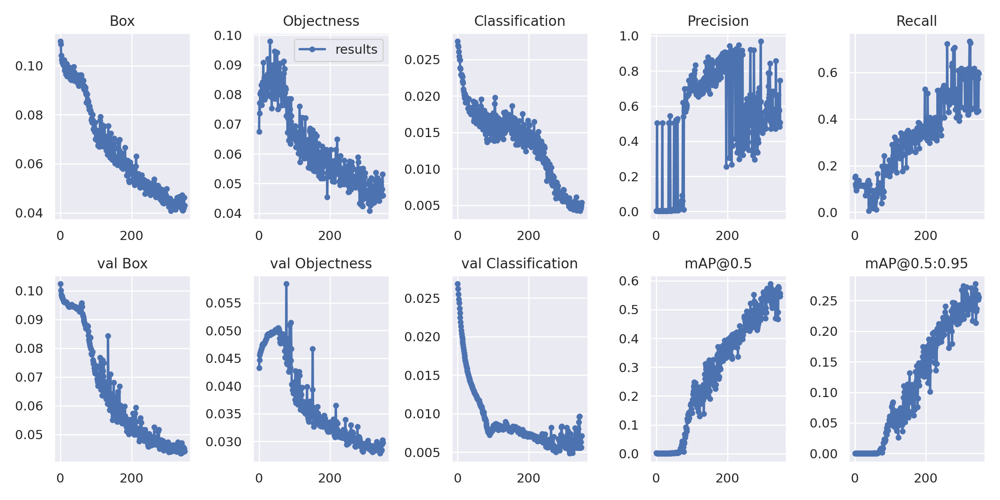

In [ ]:
from IPython.display import Image
!cp /content/yolov5/runs/train/yolov5s_results/results.png /content/yolov5
Image(filename='/content/yolov5/results.png', width=900)

In [ ]:
# final weights will be stored by default at /content/yolov5/runs/train/exp2/weights/best.pt
%cd /content/yolov5/

!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --source /content/yolov5/test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='/content/yolov5/test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
requirements: matplotlib>=3.2.2 not found and is required by YOLOv5, attempting auto-update...
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Using cached https://files.pythonhosted.org/packages/24/33/5568d443ba438d95d4db635dd69958056f087e57e1026bee56f959d53f9d/matplotlib-3.4.2-cp37-cp37m-manylinux1_x86_64.whl
  Found existing installation: matplotlib 3.1.3
    Uninstalling matplotlib-3.1.3:
      Successfully uninstalled matplotlib-3.1.3

requirements: 

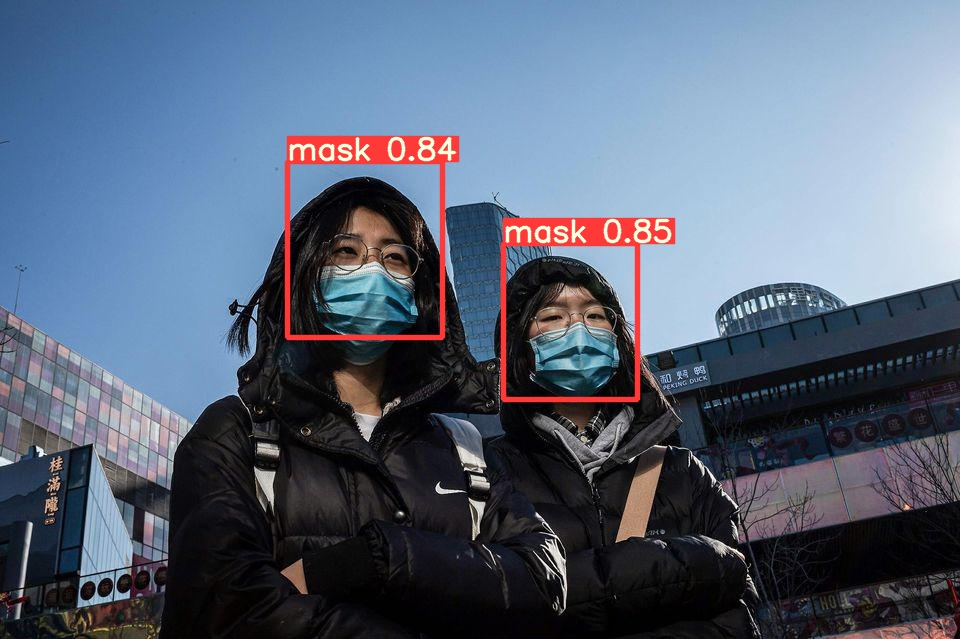

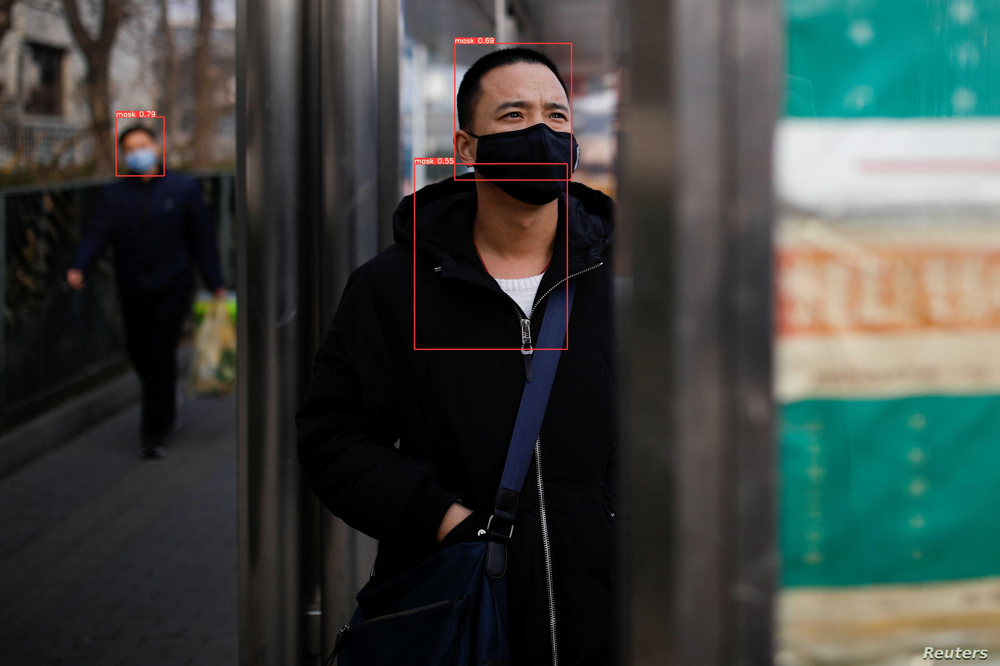

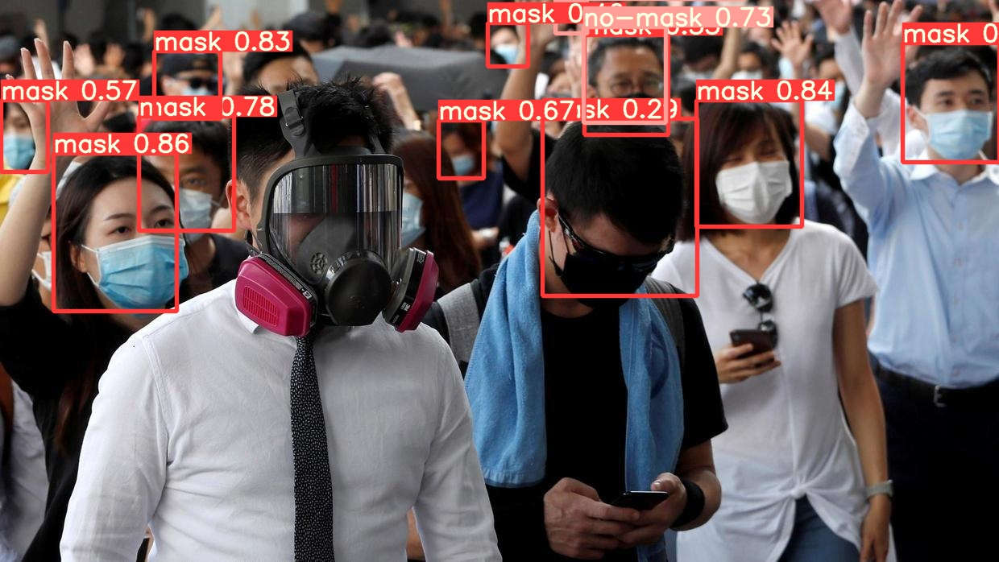

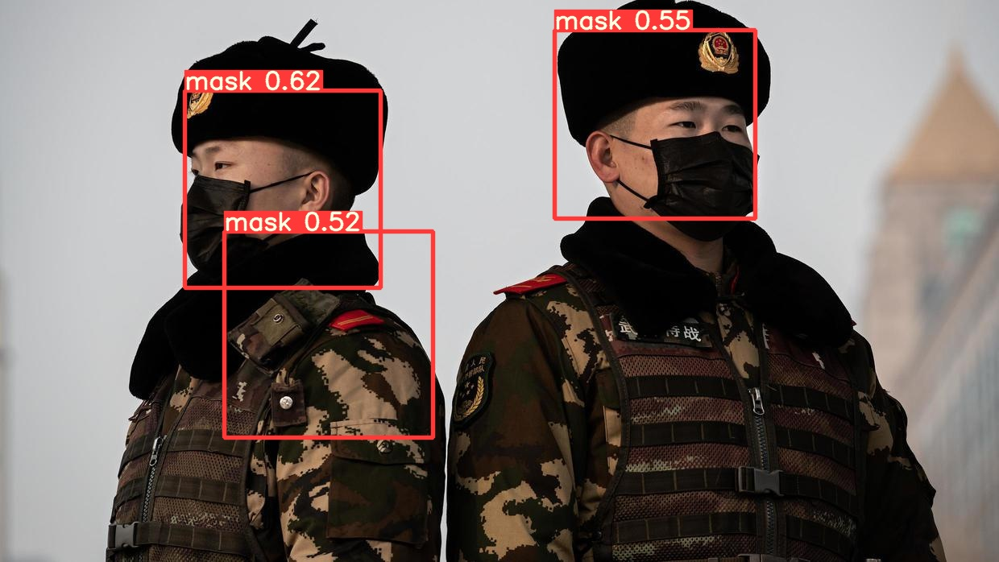

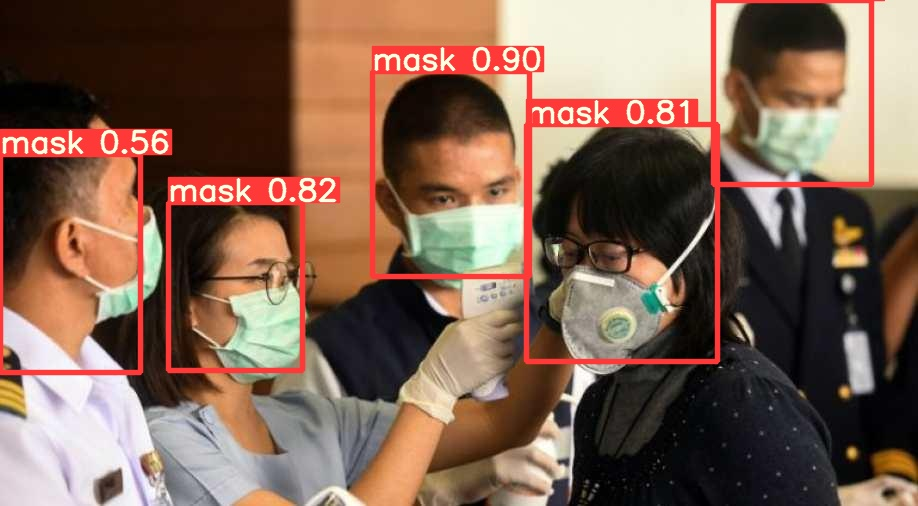

...

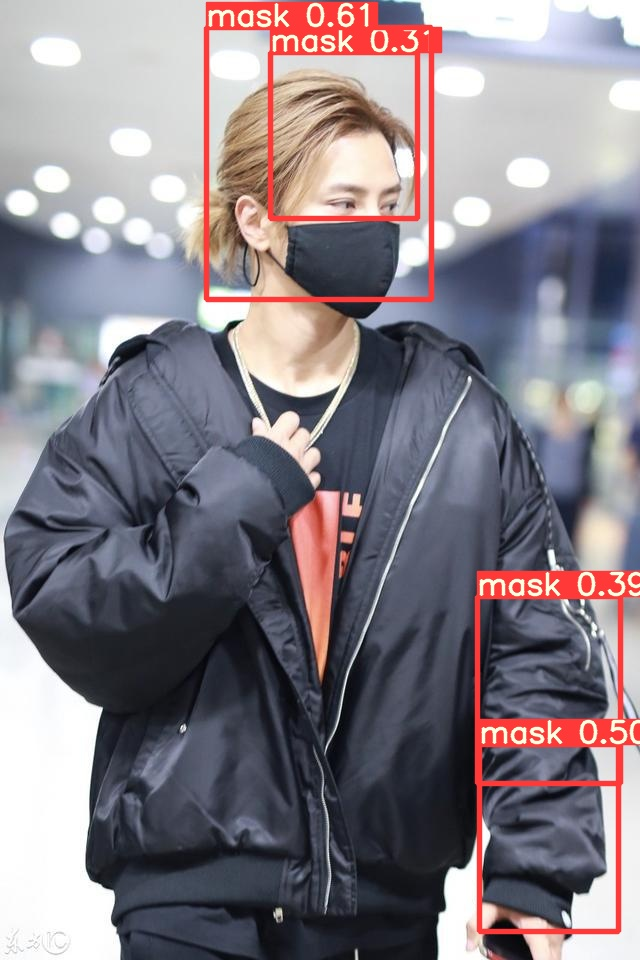

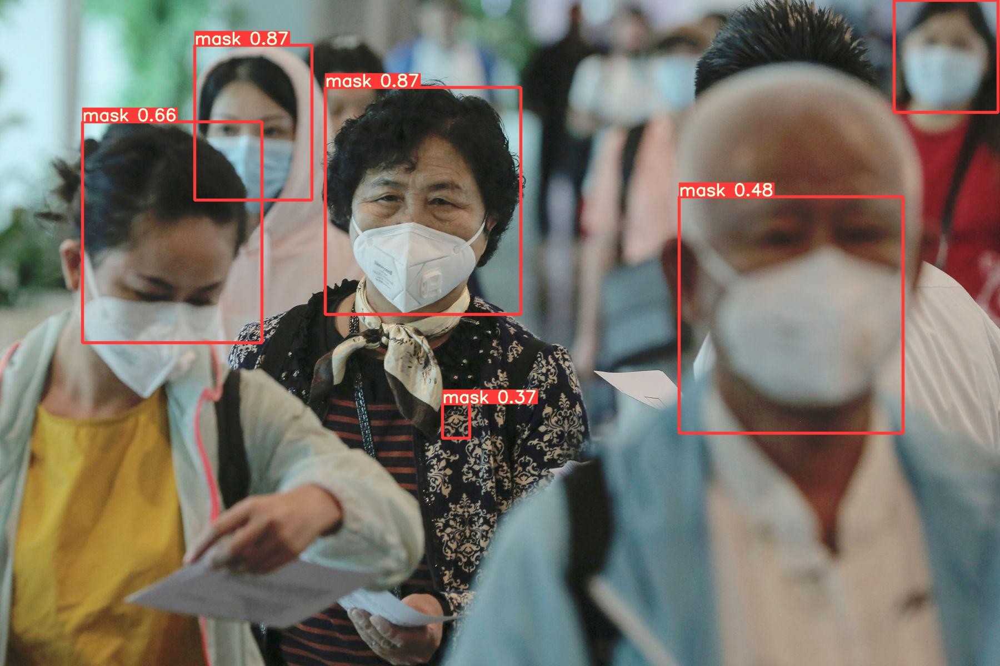

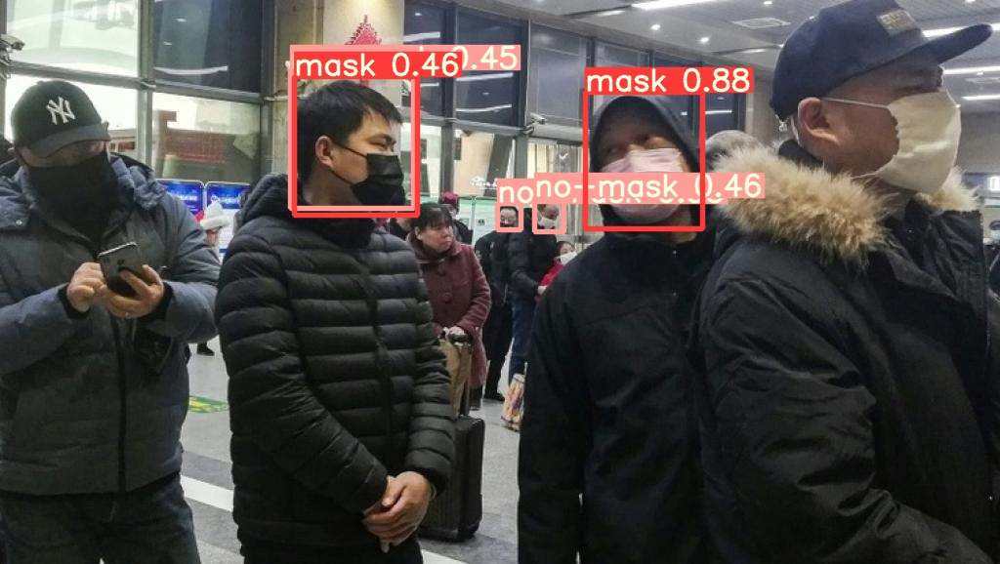

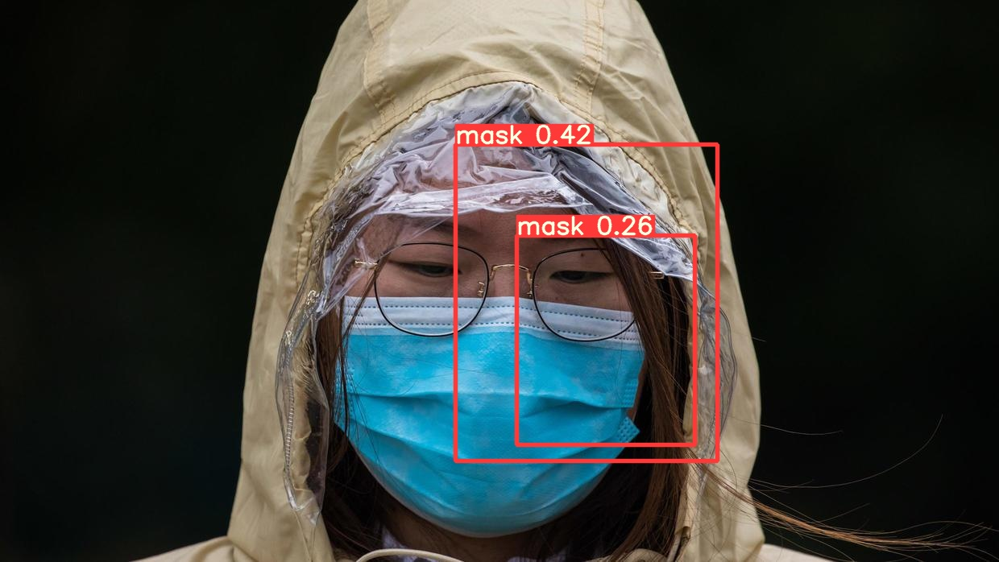

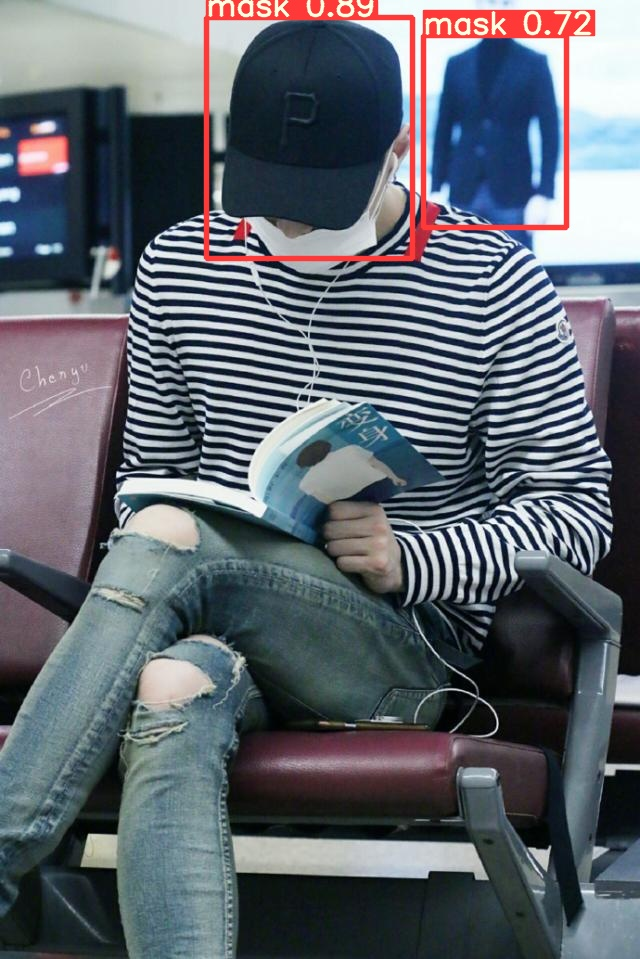

In [ ]:
import glob
from IPython.display import Image, display

for image in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=image))
    print("\n")

As can be seen in most cases good results are achieved, except for some images where the results can be confused, this may be mainly due to the training of the model, which may be insufficient, to improve the results much more we should think about increasing the number of images that make up the dataset.

In the following we will show some examples of mask detection using images from the training data. As can be seen, clearly in this case much better results will be achieved, given the training data.

GROUND TRUTH TRAINING DATA:


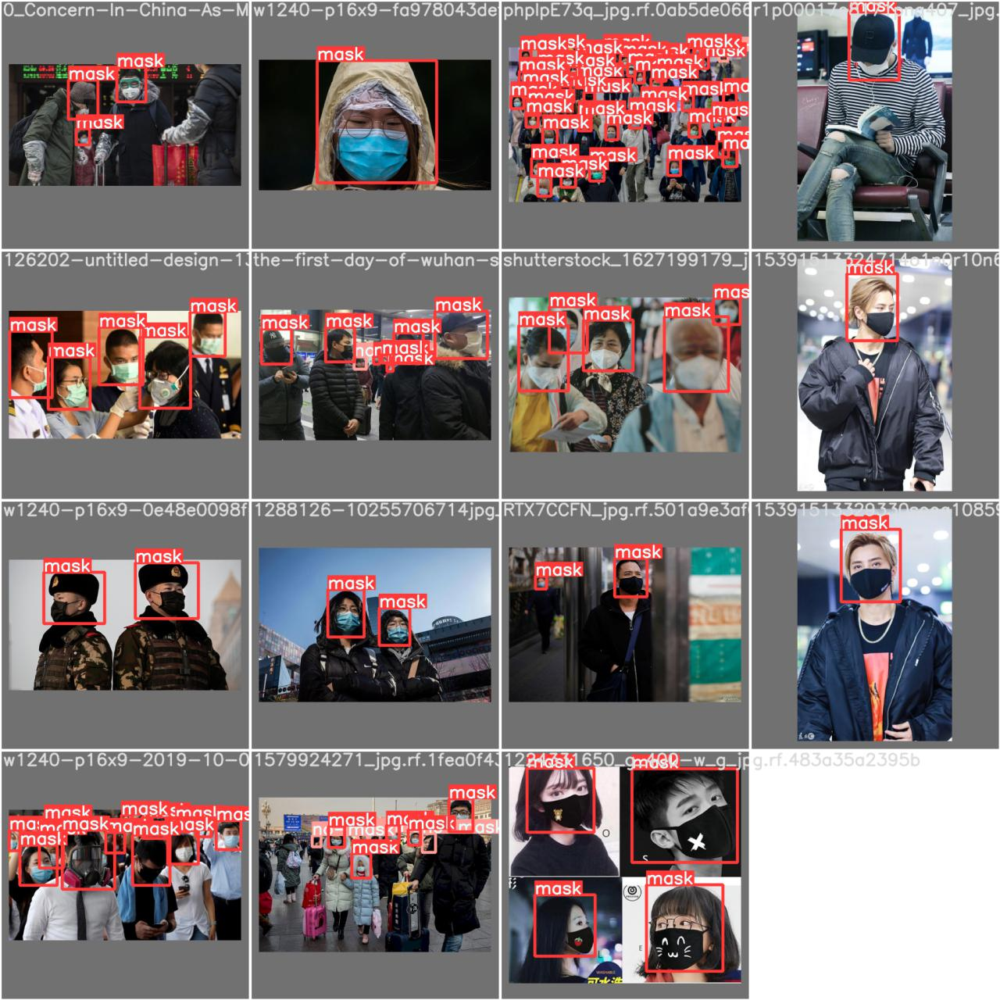

In [ ]:
# first, display our ground truth data
from IPython.display import Image
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


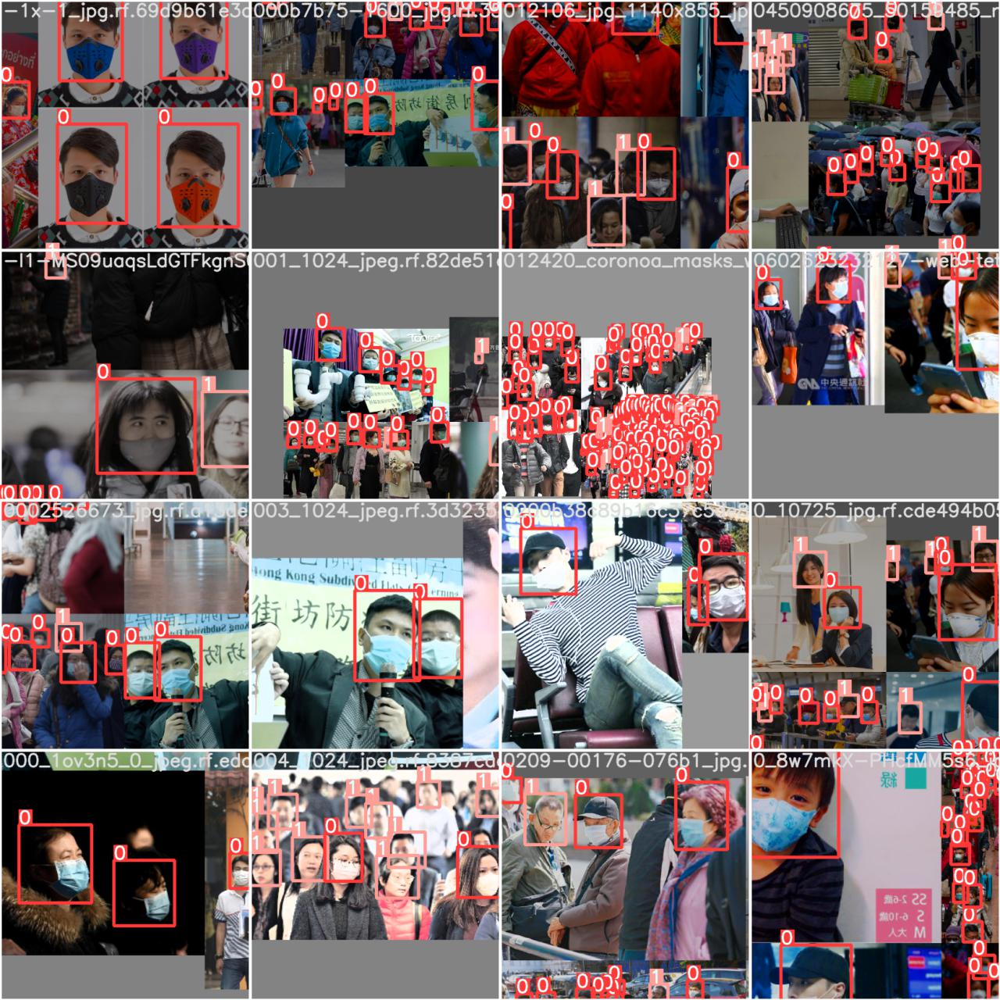

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

Next we will try a real image taken with the phone of one of the team members.

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --source /content/image_test.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='/content/image_test.jpg', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 🚀 v5.0-143-g3597d28 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPs
image 1/1 /content/image_test.jpg: 480x640 10 masks, Done. (0.014s)
Results saved to runs/detect/exp3
Done. (0.423s)


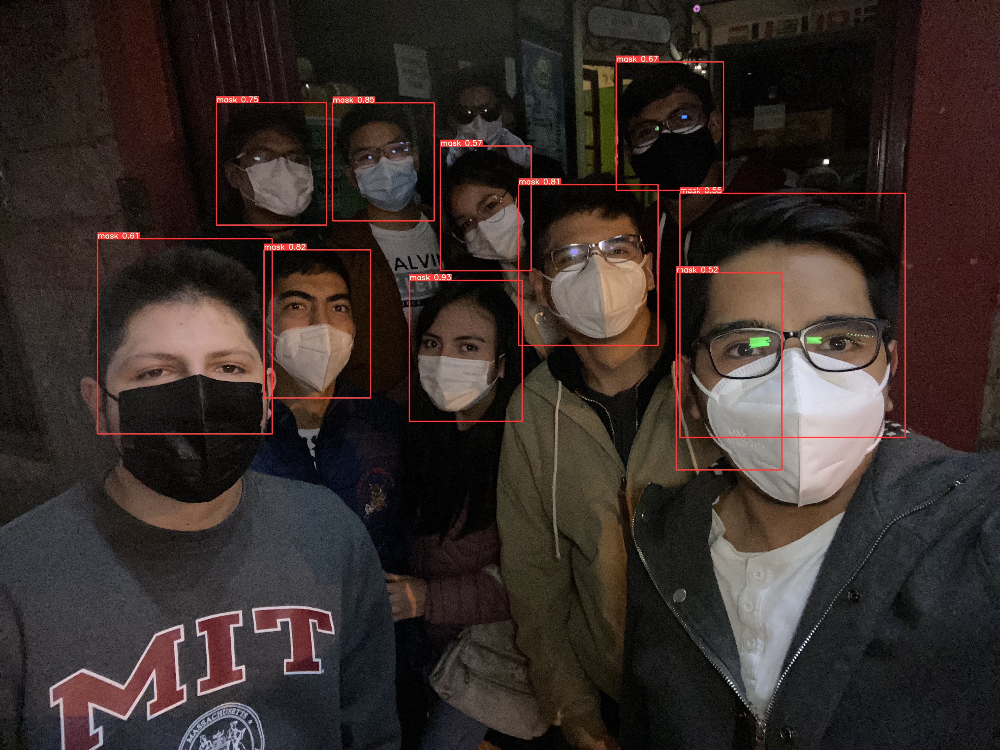

In [ ]:
import glob
from IPython.display import Image, display
for image in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'):
    display(Image(filename=image))
    print("\n")

Finally, as can be seen in the test images, both the ones downloaded from the dataset and the one taken with the phone, in both cases the results are good enough to say that the model is detecting masks correctly. It is also necessary to mention that in some cases the model may get confused, as previously mentioned this is mainly a problem generated in the training of the model, which may not generalise well some cases, this may be mainly due to the fact that the dataset is quite small and consequently the training set as well. So, if we want to improve the results obtained with the model, we should try to train it with a larger dataset and in that way we would achieve even better results.

## 6. References
[1] YOLO v5 - Train Custom Data https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

[2] Object Detection Metrics With Worked Example IoU, AP, mAP
https://towardsdatascience.com/on-object-detection-metrics-with-worked-example-216f173ed31e 

[3] IPython documentation https://ipython.readthedocs.io/en/stable/index.html# 
